In [1]:
!rm -rf /kaggle/working/*

In [2]:
import os
import sys
import logging
import warnings

# 1. Suppress Python standard warnings (FutureWarning, DeprecationWarning, UserWarning, etc.)
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# 2. Suppress TensorFlow C++ backend logs & CUDA info/warnings
# '0' = all logs, '1' = filter INFO, '2' = filter WARNING, '3' = filter ERROR
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['AUTOGRAPH_VERBOSITY'] = '0'

# 3. Suppress TensorFlow Python logging
import tensorflow as tf
tf.get_logger().setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)

# 4. Suppress standard logging messages from libraries
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# 5. Suppress Pandas warnings (like chained assignment warnings)
import pandas as pd
pd.options.mode.chained_assignment = None

In [3]:
# Standard Library Imports
import os
import glob
import random
import time

# Data Manipulation & Display
import numpy as np
import pandas as pd
from tabulate import tabulate
from IPython.display import display

# Image Processing
import cv2
from PIL import Image

# Visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# Deep Learning (TensorFlow/Keras)
import tensorflow as tf
from tensorflow.keras import layers, regularizers, Model
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Machine Learning & Metrics (Scikit-Learn)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from sklearn.calibration import calibration_curve
from sklearn.metrics import (
    accuracy_score, 
    precision_score, 
    recall_score, 
    f1_score, 
    roc_auc_score, 
    matthews_corrcoef, 
    cohen_kappa_score,
    precision_recall_curve, 
    average_precision_score,
    roc_curve, 
    auc,
    confusion_matrix, 
    classification_report
)

# Set professional plotting style
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams.update({'font.size': 12, 'figure.titlesize': 16})

%matplotlib inline

In [4]:
def set_global_seed(seed=42):
    """Sets random seeds for reproducibility."""
    # 1. Set `PYTHONHASHSEED` environment variable at a fixed value
    os.environ['PYTHONHASHSEED'] = str(seed)
    
    # 2. Set `python` built-in pseudo-random generator at a fixed value
    random.seed(seed)
    
    # 3. Set `numpy` pseudo-random generator at a fixed value
    np.random.seed(seed)
    
    # 4. Set `tensorflow` pseudo-random generator at a fixed value
    tf.random.set_seed(seed)
    
    # Optional: Force TensorFlow to use deterministic operations (may impact performance)
    # tf.config.experimental.enable_op_determinism()
    
    print(f"Global seed set to {seed}")

# Execute the function
set_global_seed(42)

Global seed set to 42


In [5]:
dataset_path = '/kaggle/input/datasets/aryashah2k/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT'
filepaths, labels = [], []

for folder in ['benign', 'malignant', 'normal']:
    folder_path = os.path.join(dataset_path, folder)
    images = glob.glob(os.path.join(folder_path, '*.png'))
    for img in images:
        if 'mask' not in img:
            filepaths.append(img)
            labels.append(folder)

df = pd.DataFrame({'filepath': filepaths, 'label': labels})


# First split: 80% for training, 20% for a temporary set
train_df, temp_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

# Second split: Divide the 20% temporary set in half to get 10% validation and 10% test
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])

# Optional: Print the sizes to confirm
print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

Train size: 624
Validation size: 78
Test size: 78


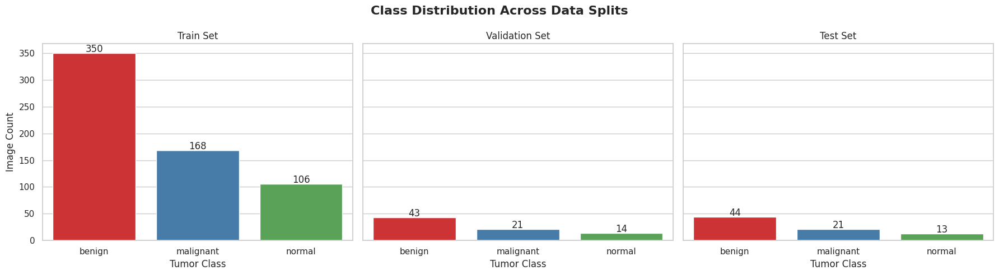

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
fig.suptitle('Class Distribution Across Data Splits', fontweight='bold')

for ax, data, title in zip(axes, [train_df, val_df, test_df], ['Train Set', 'Validation Set', 'Test Set']):
    sns.countplot(data=data, x='label', ax=ax, order=['benign', 'malignant', 'normal'], palette="Set1")
    ax.set_title(title)
    ax.set_xlabel('Tumor Class')
    ax.set_ylabel('Image Count')
    
    # Add count labels on top of bars
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + 0.4, p.get_height() + 2), ha='center')

plt.tight_layout()
plt.show()

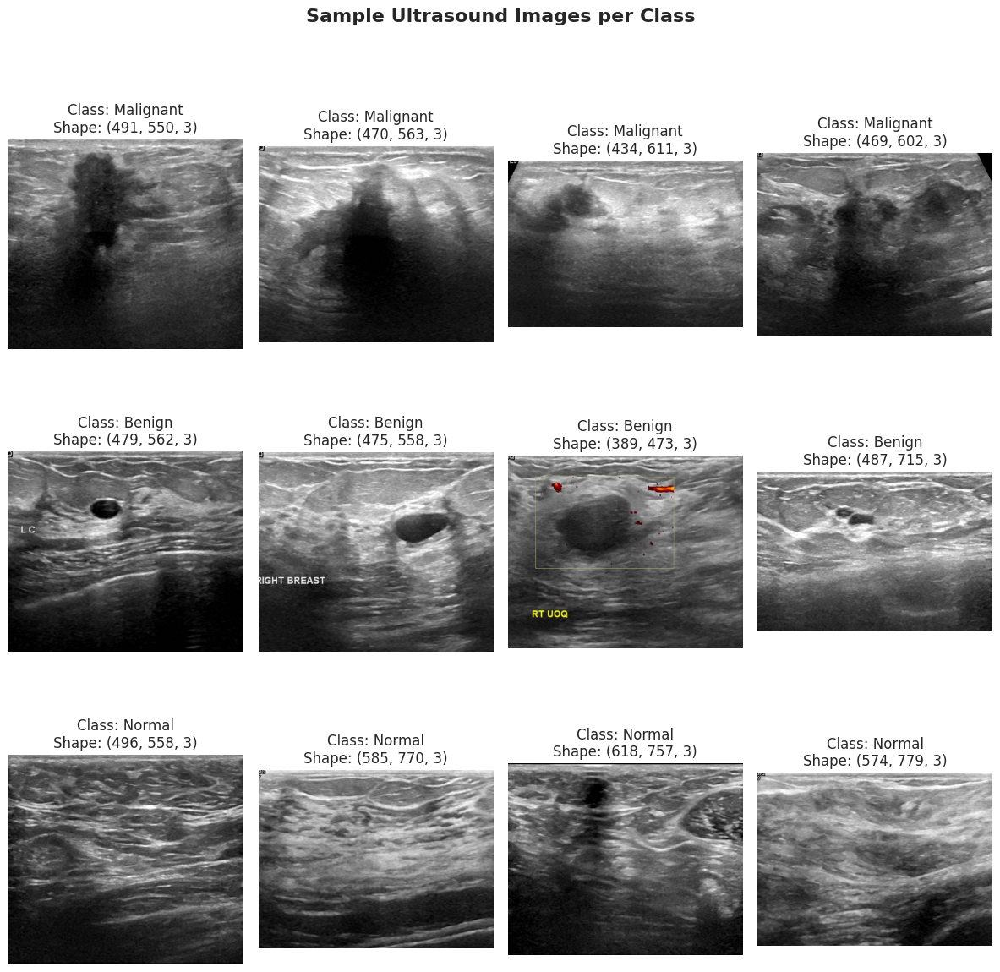

In [7]:
def plot_samples_per_class(df, num_samples=3):
    classes = df['label'].unique()
    fig, axes = plt.subplots(len(classes), num_samples, figsize=(12, 4 * len(classes)))
    fig.suptitle('Sample Ultrasound Images per Class', y=1.02, fontweight='bold')
    
    for i, cls in enumerate(classes):
        # Randomly sample images from the current class
        sample_paths = df[df['label'] == cls].sample(num_samples, random_state=42)['filepath'].values
        
        for j, img_path in enumerate(sample_paths):
            img = Image.open(img_path)
            ax = axes[i, j] if len(classes) > 1 else axes[j]
            ax.imshow(img, cmap='gray')
            ax.set_title(f"Class: {cls.capitalize()}\nShape: {np.array(img).shape}")
            ax.axis('off')
            
    plt.tight_layout()
    plt.show()

plot_samples_per_class(train_df, num_samples=4)

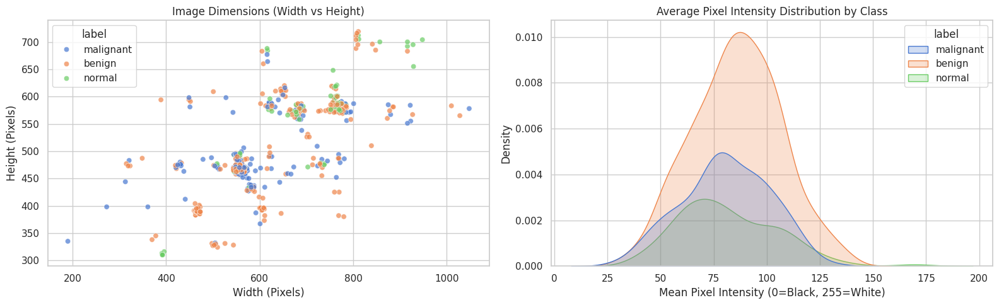

In [8]:
def analyze_image_properties(df):
    widths, heights, means = [], [], []
    
    for img_path in df['filepath']:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        heights.append(img.shape[0])
        widths.append(img.shape[1])
        means.append(np.mean(img))
        
    df_props = df.copy()
    df_props['width'] = widths
    df_props['height'] = heights
    df_props['mean_intensity'] = means
    return df_props

train_props = analyze_image_properties(train_df)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Plot 1: Image Dimensions Scatter
sns.scatterplot(data=train_props, x='width', y='height', hue='label', alpha=0.7, ax=axes[0])
axes[0].set_title('Image Dimensions (Width vs Height)')
axes[0].set_xlabel('Width (Pixels)')
axes[0].set_ylabel('Height (Pixels)')

# Plot 2: Pixel Intensity Distribution
sns.kdeplot(data=train_props, x='mean_intensity', hue='label', fill=True, ax=axes[1])
axes[1].set_title('Average Pixel Intensity Distribution by Class')
axes[1].set_xlabel('Mean Pixel Intensity (0=Black, 255=White)')

plt.tight_layout()
plt.show()

In [9]:
# Target dimensions & settings
img_size = (224, 224)
batch_size = 32
seed_value = 42

# =====================================================================
# 1. TRAINING GENERATOR (All Augmentation & Preprocessing Parameters)
# =====================================================================
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    # --- Normalization & Scaling ---
    rescale=1.0 / 255.0,              # Scales pixel values to [0, 1]
    featurewise_center=False,         # Set input mean to 0 over the dataset (requires .fit())
    samplewise_center=False,          # Set each sample mean to 0
    featurewise_std_normalization=False, # Divide inputs by std of dataset (requires .fit())
    samplewise_std_normalization=False,  # Divide each input by its own std
    zca_whitening=False,              # Apply ZCA whitening (rarely used with CNNs; requires .fit())
    zca_epsilon=1e-6,                 # Epsilon for ZCA whitening
    
    # --- Geometric Augmentations ---
    rotation_range=20,                # Degree range for random rotations (0 to 180)
    width_shift_range=0.1,            # Fraction of total width for horizontal translation
    height_shift_range=0.1,           # Fraction of total height for vertical translation
    shear_range=0.1,                  # Shear angle in counter-clockwise direction in degrees
    zoom_range=0.1,                   # Range for random zoom ([lower, upper] or float)
    horizontal_flip=True,             # Randomly flip inputs horizontally
    vertical_flip=False,              # Randomly flip inputs vertically (typically False for ultrasound)
    
    # --- Color & Intensity Transformations ---
    brightness_range=[0.8, 1.2],      # Range for picking a brightness shift value
    channel_shift_range=0.0,          # Range for random channel shifts
    
    # --- Boundary Fill & Formatting ---
    fill_mode='nearest',              # Points outside boundaries: 'nearest', 'constant', 'reflect', 'wrap'
    cval=0.0,                         # Value used when fill_mode = 'constant'
    data_format='channels_last',      # Format: 'channels_last' (default) or 'channels_first'
    preprocessing_function=None,      # Custom function applied to each input image after augmentation
    dtype='float32'                   # Precision data type for generated arrays
)

# =====================================================================
# 2. VALIDATION & TEST GENERATORS (Strictly Clean, No Augmentations)
# =====================================================================
val_test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0 / 255.0,              # Only scale values; do not alter geometry or color
    dtype='float32'
)

# =====================================================================
# 3. FLOW GENERATORS (All Data Flow & Extraction Parameters)
# =====================================================================

# --- Training Flow ---
train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepath',                 # Column containing image paths
    y_col='label',                    # Column containing target class labels
    target_size=img_size,             # Dimensions to which all images found will be resized
    color_mode='rgb',                 # 'rgb', 'grayscale', or 'rgba'
    classes=None,                     # Optional list of class subdirectories / target names
    class_mode='categorical',         # 'categorical', 'binary', 'sparse', 'input', 'raw', or None
    batch_size=batch_size,            # Size of the batches of data
    shuffle=True,                     # Shuffle training data at the start of each epoch
    seed=seed_value,                  # Random seed for repeatable shuffling/transformations
    save_to_dir=None,                 # Optional: Path to save augmented pictures to disk (debugging)
    save_prefix='',                   # Prefix for saved images
    save_format='png',                # Format for saved images: 'png' or 'jpeg'
    interpolation='bilinear',         # 'nearest', 'bilinear', 'bicubic', 'lanczos', 'box'
    validate_filenames=True           # Validate whether filepaths exist in the filesystem
)

# --- Validation Flow ---
val_gen = val_test_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='filepath',
    y_col='label',
    target_size=img_size,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False,                    # Must be False for consistent evaluation
    seed=seed_value,
    interpolation='bilinear',
    validate_filenames=True
)

# --- Test Flow ---
test_gen = val_test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filepath',
    y_col='label',
    target_size=img_size,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False,                    # Must be False to evaluate predictions against ground truth
    seed=seed_value,
    interpolation='bilinear',
    validate_filenames=True
)

Found 624 validated image filenames belonging to 3 classes.
Found 78 validated image filenames belonging to 3 classes.
Found 78 validated image filenames belonging to 3 classes.


In [10]:
num_classes = len(train_gen.class_indices)
print(train_gen.class_indices)

{'benign': 0, 'malignant': 1, 'normal': 2}


Visualizing 12 comparisons of Original vs. Augmented transformations...


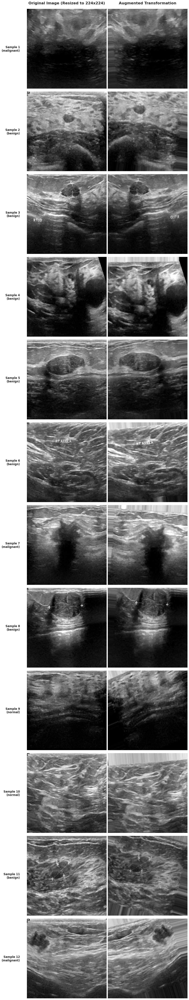

In [11]:

# --- Configuration for Visual Comparison ---
num_comparisons = 12
cols = 2
target_size = (224, 224) # Must match your model input size

# Sample 12 random images from the training dataframe
sample_df = train_df.sample(num_comparisons, random_state=seed_value)

# Set up the matplotlib figure (12 rows, 2 columns)
fig, axes = plt.subplots(num_comparisons, cols, figsize=(12, num_comparisons * 5))
plt.subplots_adjust(wspace=0.1, hspace=0.4) # Adjust spacing for clarity

# Define titles for the top row
axes[0, 0].set_title("Original Image (Resized to 224x224)", fontsize=16, fontweight='bold', pad=20)
axes[0, 1].set_title("Augmented Transformation", fontsize=16, fontweight='bold', pad=20)

# Iteratively load, transform, and plot
for i, (index, row) in enumerate(sample_df.iterrows()):
    img_path = row['filepath']
    label = row['label']

    # 1. Load the original image (resized)
    # ImageDataGenerator processes images at target_size, so we must compare at that size.
    # Color mode 'rgb' is chosen because your generator uses color_mode='rgb'.
    original_pil = load_img(img_path, target_size=target_size, color_mode='rgb')
    
    # 2. Convert to numpy array [0-255 range] for processing
    img_array_0255 = img_to_array(original_pil)

    # 3. Apply the custom random transformations specified in train_datagen
    # Note: random_transform applies geometric and color augmentations but NOT rescaling.
    transformed_array_0255 = train_datagen.random_transform(img_array_0255)

    # 4. Final Processing for Visualization (Apply Rescaling [0, 1])
    # Matplotlib visualizes float arrays correctly when they are normalized to [0.0, 1.0]
    original_display = img_array_0255 * (1.0 / 255.0)
    transformed_display = transformed_array_0255 * (1.0 / 255.0)

    # --- Plotting ---
    # Column 1: Original (Processed)
    axes[i, 0].imshow(original_display)
    axes[i, 0].axis('off')
    # Add index and label information on the far left
    axes[i, 0].text(-20, target_size[0]//2, f"Sample {i+1}\n({label})", 
                    fontsize=12, fontweight='bold', ha='right', va='center', rotation=0)

    # Column 2: Augmented
    axes[i, 1].imshow(transformed_display)
    axes[i, 1].axis('off')

print(f"Visualizing {num_comparisons} comparisons of Original vs. Augmented transformations...")
plt.tight_layout()
plt.show()

In [12]:
# from tabulate import tabulate
# from tensorflow.keras.callbacks import Callback
# import time

# class TabulateLogger(Callback):
#     def __init__(self):
#         super().__init__()
#         self.history = []

#     def on_epoch_begin(self, epoch, logs=None):
#         self.epoch_start = time.time()

#     def on_epoch_end(self, epoch, logs=None):
#         logs = logs or {}
#         elapsed = time.time() - self.epoch_start

#         data = [
#             ["Epoch", epoch + 1],
#             ["Loss", f"{logs.get('loss', 0):.4f}"],
#             ["Accuracy", f"{logs.get('accuracy', 0):.4f}"],
#             ["AUC", f"{logs.get('auc', 0):.4f}"],
#             ["Precision", f"{logs.get('precision', 0):.4f}"],
#             ["Recall", f"{logs.get('recall', 0):.4f}"],
#             ["Val Loss", f"{logs.get('val_loss', 0):.4f}"],
#             ["Val Accuracy", f"{logs.get('val_accuracy', 0):.4f}"],
#             ["Val AUC", f"{logs.get('val_auc', 0):.4f}"],
#             ["Val Precision", f"{logs.get('val_precision', 0):.4f}"],
#             ["Val Recall", f"{logs.get('val_recall', 0):.4f}"],
#             ["Time", f"{elapsed:.1f}s"]
#         ]

#         self.history.append(logs)
#         print("\n" + tabulate(data, tablefmt="fancy_grid"))

In [13]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def se_block(x, reduction=16):
    channels = x.shape[-1]
    se = layers.GlobalAveragePooling2D()(x)
    se = layers.Dense(channels // reduction, activation='relu')(se)
    se = layers.Dense(channels, activation='sigmoid')(se)
    se = layers.Reshape((1, 1, channels))(se)
    return layers.Multiply()([x, se])

def conv_bn_act(x, filters, kernel_size=3, strides=1):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    return layers.Activation('relu')(x)

def residual_se_block(x, filters, strides=1):
    shortcut = x
    x = conv_bn_act(x, filters, strides=strides)
    x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = se_block(x)

    if shortcut.shape[-1] != filters or strides != 1:
        shortcut = layers.Conv2D(filters, 1, strides=strides, padding='same', use_bias=False)(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    x = layers.Add()([x, shortcut])
    return layers.Activation('relu')(x)

def build_model(input_shape=(224, 224, 3), num_classes=3):
    inputs = layers.Input(shape=input_shape)

    x = conv_bn_act(inputs, 32, kernel_size=7, strides=2)
    x = layers.MaxPooling2D(3, strides=2, padding='same')(x)

    x = residual_se_block(x, 64)
    x = residual_se_block(x, 64)

    x = residual_se_block(x, 128, strides=2)
    x = residual_se_block(x, 128)

    x = residual_se_block(x, 256, strides=2)
    x = residual_se_block(x, 256)

    x = residual_se_block(x, 512, strides=2)
    x = residual_se_block(x, 512)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    return Model(inputs, outputs, name='ResSE_CNN_BUSI')

model = build_model(input_shape=(224, 224, 3), num_classes=3)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='auc', multi_label=True),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall')
    ]
)

model.summary()

I0000 00:00:1787170123.104502   13082 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "ResSE_CNN_BUSI"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │      4,704 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 56, 56,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 56, 56,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 56, 56,    │     36,864 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ batch_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 4)         │        260 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │        320 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 64)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 56, 56,    │      2,048 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 56, 56,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ multiply[0][0], 

 Total params: 11,387,355 (43.44 MB)

 Trainable params: 11,377,179 (43.40 MB)

 Non-trainable params: 10,176 (39.75 KB)

In [14]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath='best_model.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=12,
    restore_best_weights=True,
    verbose=1
)



history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[reduce_lr, checkpoint, early_stop],
    verbose=1
)

Epoch 1/50
 2/20 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.3984 - auc: 0.5024 - loss: 2.0335 - precision: 0.3620 - recall: 0.3047 

I0000 00:00:1787170155.550207   13145 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3751 - auc: 0.5311 - loss: 1.7724 - precision: 0.3662 - recall: 0.3082
Epoch 1: val_loss improved from None to 19.93965, saving model to best_model.keras

Epoch 1: finished saving model to best_model.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.3686 - auc: 0.5403 - loss: 1.6822 - precision: 0.3714 - recall: 0.3125 - val_accuracy: 0.1795 - val_auc: 0.5080 - val_loss: 19.9397 - val_precision: 0.1795 - val_recall: 0.1795 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 633ms/step - accuracy: 0.4214 - auc: 0.5668 - loss: 1.4586 - precision: 0.4292 - recall: 0.3681
Epoch 2: val_loss improved from 19.93965 to 1.47409, saving model to best_model.keras

Epoch 2: finished saving model to best_model.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 729ms/step - accuracy: 0.4247 - auc: 0.5569 - loss: 1.4292 - precision: 0.4388 - recall: 0.3622 - val_accuracy: 0.3846 - val_auc: 0.5388 - val_loss: 1.4741 - val_precision: 0.3939 - 

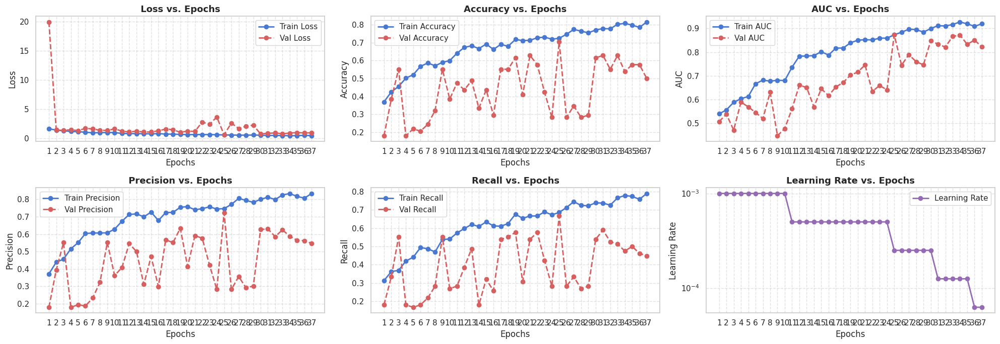

In [15]:

# Define all metrics from your training log
metrics_config = [
    ("loss", "val_loss", "Loss"),
    ("accuracy", "val_accuracy", "Accuracy"),
    ("auc", "val_auc", "AUC"),
    ("precision", "val_precision", "Precision"),
    ("recall", "val_recall", "Recall"),
]

epochs = range(1, len(history.history["loss"]) + 1)

# Create 2x3 subplot layout for all 5 metrics + Learning Rate
fig, axes = plt.subplots(2, 3, figsize=(20, 7))
axes = axes.flatten()

# Plot metrics
for idx, (train_metric, val_metric, title) in enumerate(metrics_config):
    ax = axes[idx]
    ax.plot(
        epochs,
        history.history[train_metric],
        "bo-",
        label=f"Train {title}",
        linewidth=2,
    )
    ax.plot(
        epochs,
        history.history[val_metric],
        "ro--",
        label=f"Val {title}",
        linewidth=2,
    )
    ax.set_title(f"{title} vs. Epochs", fontsize=13, fontweight="bold")
    ax.set_xlabel("Epochs")
    ax.set_ylabel(title)
    ax.set_xticks(epochs)
    ax.grid(True, linestyle="--", alpha=0.6)
    ax.legend(loc="best")

# Plot Learning Rate on the 6th subplot
lr_key = "learning_rate" if "learning_rate" in history.history else "lr"
if lr_key in history.history:
    axes[5].plot(
        epochs,
        history.history[lr_key],
        "mo-",
        label="Learning Rate",
        linewidth=2,
    )
    axes[5].set_title(
        "Learning Rate vs. Epochs", fontsize=13, fontweight="bold"
    )
    axes[5].set_xlabel("Epochs")
    axes[5].set_ylabel("Learning Rate")
    axes[5].set_xticks(epochs)
    axes[5].set_yscale("log")
    axes[5].grid(True, linestyle="--", alpha=0.6)
    axes[5].legend(loc="best")
else:
    fig.delaxes(axes[5])

plt.tight_layout()
plt.show()

Generating predictions on the test data...
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step


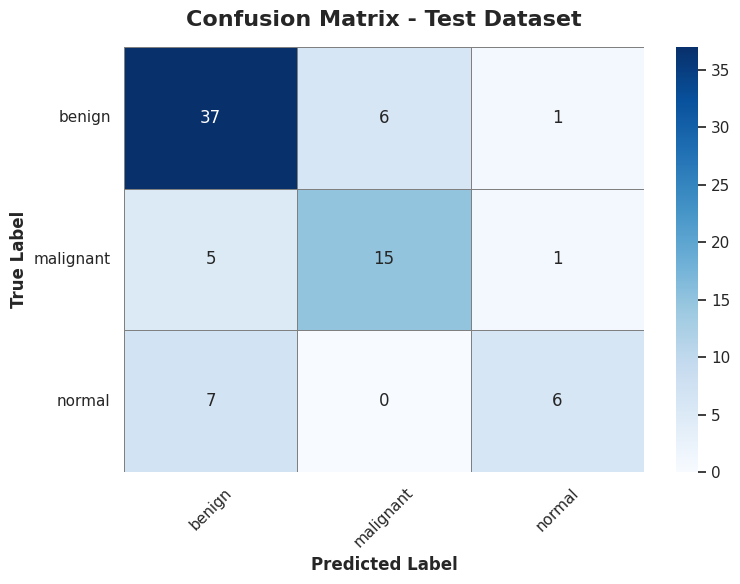


CLASSIFICATION REPORT
              precision    recall  f1-score   support

      benign       0.76      0.84      0.80        44
   malignant       0.71      0.71      0.71        21
      normal       0.75      0.46      0.57        13

    accuracy                           0.74        78
   macro avg       0.74      0.67      0.69        78
weighted avg       0.74      0.74      0.74        78



In [16]:

# 1. Generate predictions on the test set
print("Generating predictions on the test data...")
predictions = model.predict(test_gen, verbose=1)

# 2. Convert prediction probabilities to predicted class indices
predicted_classes = np.argmax(predictions, axis=1)

# 3. Retrieve the true class indices and class labels from the generator
true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

# 4. Compute the Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)

# 5. Plot the Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm, 
    annot=True, 
    fmt='d', 
    cmap='Blues',
    xticklabels=class_labels, 
    yticklabels=class_labels,
    linewidths=0.5, 
    linecolor='gray'
)

plt.title('Confusion Matrix - Test Dataset', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Predicted Label', fontsize=12, fontweight='bold')
plt.ylabel('True Label', fontsize=12, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# 6. Print the Classification Report for detailed precision, recall, and F1-score
print("\n" + "="*50)
print("CLASSIFICATION REPORT")
print("="*50)
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

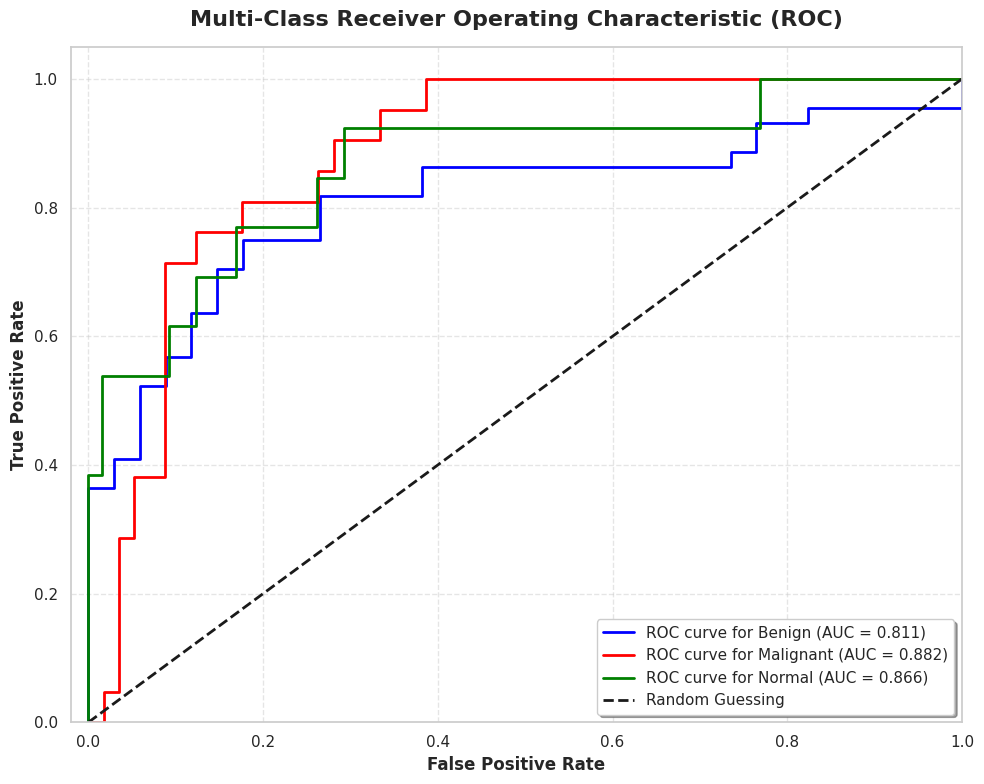

In [17]:
# 1. Binarize the true labels for multi-class ROC calculation
# true_classes comes from test_gen.classes (0, 1, 2)
y_true_bin = label_binarize(true_classes, classes=list(range(len(class_labels))))
n_classes = y_true_bin.shape[1]

# 2. Setup dictionaries to hold False Positive Rates (FPR) and True Positive Rates (TPR)
fpr = dict()
tpr = dict()
roc_auc = dict()

# 3. Calculate ROC curve and ROC area for each class
for i in range(n_classes):
    # predictions[:, i] gets the predicted probabilities for the i-th class
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 4. Plot all ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green'] # Customize colors if you have more classes

for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i], 
        tpr[i], 
        color=color, 
        lw=2,
        label=f'ROC curve for {class_labels[i].capitalize()} (AUC = {roc_auc[i]:0.3f})'
    )

# 5. Plot the baseline (random guessing line)
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guessing')

# 6. Formatting the plot
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=12, fontweight='bold')
plt.title('Multi-Class Receiver Operating Characteristic (ROC)', fontsize=16, fontweight='bold', pad=15)
plt.legend(loc="lower right", fontsize=11, frameon=True, shadow=True)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

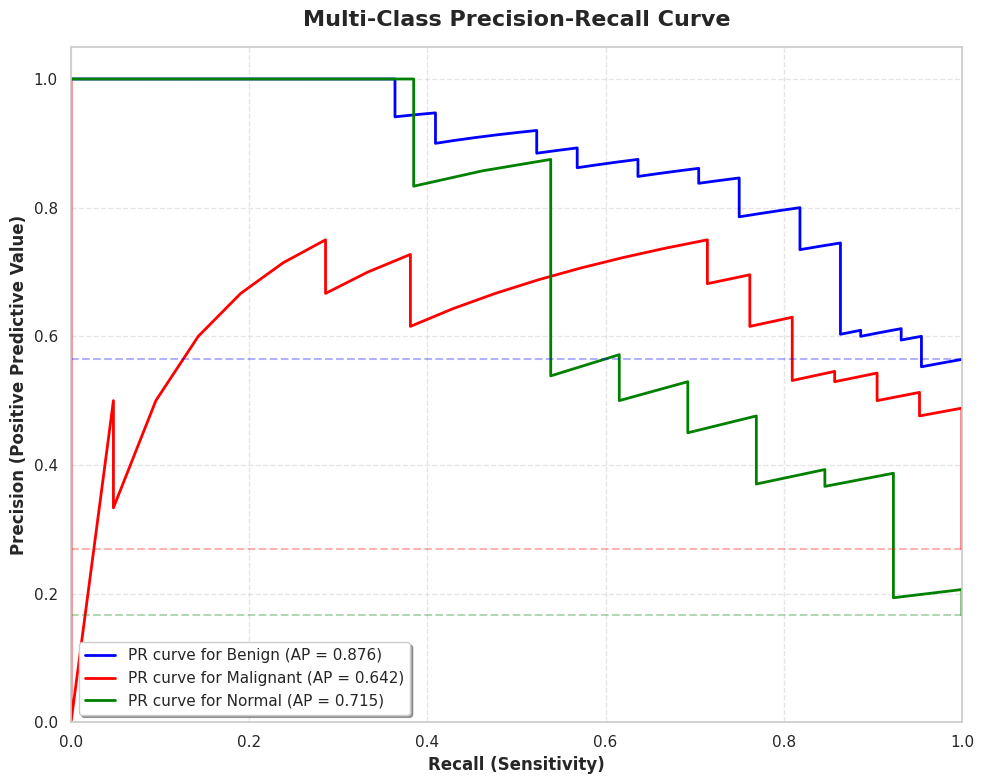

In [18]:

# 1. Binarize the true labels (re-running this ensures the cell works independently)
y_true_bin = label_binarize(true_classes, classes=list(range(len(class_labels))))
n_classes = y_true_bin.shape[1]

# 2. Setup dictionaries to hold Precision, Recall, and Average Precision (AP)
precision = dict()
recall = dict()
avg_precision = dict()

# 3. Calculate PR curve and Average Precision for each class
for i in range(n_classes):
    # Calculate precision and recall for the current class
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], predictions[:, i])
    # Calculate Average Precision (AP)
    avg_precision[i] = average_precision_score(y_true_bin[:, i], predictions[:, i])

# 4. Plot all Precision-Recall curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green'] # Match the colors used in the ROC curve for consistency

for i, color in zip(range(n_classes), colors):
    plt.plot(
        recall[i], 
        precision[i], 
        color=color, 
        lw=2,
        label=f'PR curve for {class_labels[i].capitalize()} (AP = {avg_precision[i]:0.3f})'
    )

# 5. Add a baseline (representing a random classifier based on class prevalence)
# We calculate the overall prevalence of positive cases to set the baseline height
for i in range(n_classes):
    baseline = sum(y_true_bin[:, i]) / len(y_true_bin[:, i])
    plt.axhline(y=baseline, color=colors[i], linestyle='--', alpha=0.3)

# 6. Formatting the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall (Sensitivity)', fontsize=12, fontweight='bold')
plt.ylabel('Precision (Positive Predictive Value)', fontsize=12, fontweight='bold')
plt.title('Multi-Class Precision-Recall Curve', fontsize=16, fontweight='bold', pad=15)
plt.legend(loc="lower left", fontsize=11, frameon=True, shadow=True)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [19]:

# 1. Calculate Standard Metrics (Using 'macro' average to evaluate all classes equally)
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='macro')
recall = recall_score(true_classes, predicted_classes, average='macro')
f1 = f1_score(true_classes, predicted_classes, average='macro')

# 2. Calculate ROC AUC (Requires prediction probabilities, One-vs-Rest approach)
roc_auc = roc_auc_score(true_classes, predictions, multi_class='ovr', average='macro')

# 3. Calculate Advanced Agreement Metrics
mcc = matthews_corrcoef(true_classes, predicted_classes)
kappa = cohen_kappa_score(true_classes, predicted_classes)

# 4. Format and display the results in a clean DataFrame
metrics_summary = pd.DataFrame({
    'Evaluation Metric': [
        'Accuracy', 
        'Precision (Macro)', 
        'Recall (Macro)', 
        'F1-Score (Macro)', 
        'ROC AUC (Macro OVR)', 
        'Matthews Correlation Coefficient (MCC)', 
        "Cohen's Kappa"
    ],
    'Score': [accuracy, precision, recall, f1, roc_auc, mcc, kappa]
})

# Format scores to 4 decimal places for professional presentation
metrics_summary['Score'] = metrics_summary['Score'].apply(lambda x: f"{x:.4f}")

print("="*60)
print("OVERALL MODEL PERFORMANCE SUMMARY")
print("="*60)
display(metrics_summary)

OVERALL MODEL PERFORMANCE SUMMARY


,Evaluation Metric,Score
0,Accuracy,0.7436
1,Precision (Macro),0.7398
2,Recall (Macro),0.6722
3,F1-Score (Macro),0.6938
4,ROC AUC (Macro OVR),0.8531
5,Matthews Correlation Coefficient (MCC),0.5437
6,Cohen's Kappa,0.5389


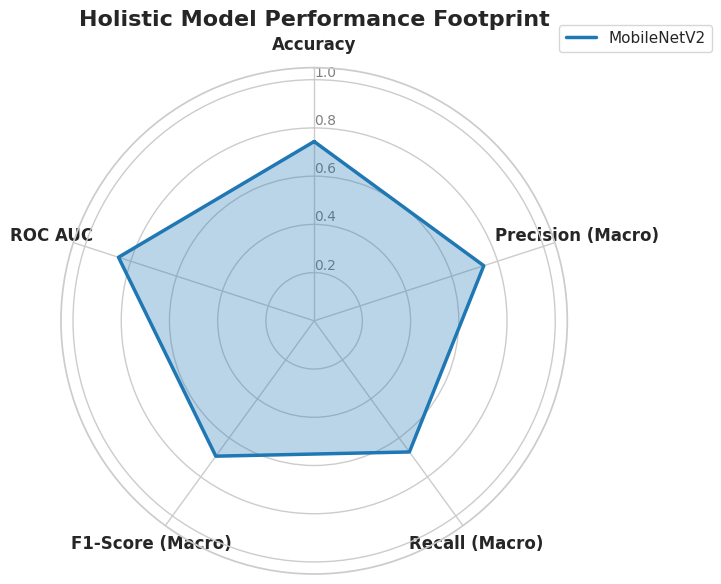

In [20]:

# 1. Define the metrics and extract their values from the previous cell
categories = ['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)', 'ROC AUC']
values = [accuracy, precision, recall, f1, roc_auc]

# 2. Calculate angles for the circular plot
N = len(categories)
angles = [n / float(N) * 2 * np.pi for n in range(N)]

# 3. Close the loop (append the first value to the end to close the circular polygon)
values += values[:1]
angles += angles[:1]

# 4. Initialize the polar plot
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(polar=True))

# 5. Draw the outline and set the category labels
ax.set_theta_offset(np.pi / 2) # Start at the top
ax.set_theta_direction(-1)     # Draw clockwise
plt.xticks(angles[:-1], categories, size=12, fontweight='bold')

# 6. Set the radial axes (Y-axis limits from 0 to 1)
ax.set_rlabel_position(0)
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], ["0.2", "0.4", "0.6", "0.8", "1.0"], color="grey", size=10)
plt.ylim(0, 1.05)

# 7. Plot the data line and fill the area
ax.plot(angles, values, color='#1f77b4', linewidth=2.5, linestyle='solid', label='MobileNetV2')
ax.fill(angles, values, color='#1f77b4', alpha=0.3)

# 8. Formatting
plt.title('Holistic Model Performance Footprint', size=16, fontweight='bold', pad=30)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=11, frameon=True)
plt.tight_layout()
plt.show()

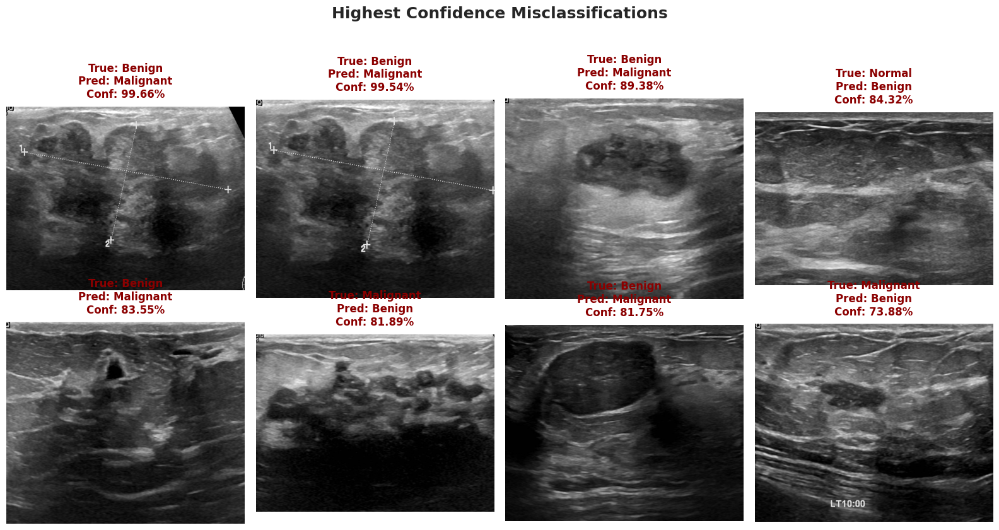

In [21]:

# 1. Identify indices where the prediction does not match the true label
incorrect_indices = np.where(predicted_classes != true_classes)[0]

if len(incorrect_indices) == 0:
    print("Incredible! There are zero misclassifications on the test set.")
else:
    # 2. Extract paths, labels, and confidence scores for errors
    error_data = []
    for i in incorrect_indices:
        filepath = test_gen.filepaths[i]
        true_label = class_labels[true_classes[i]]
        pred_label = class_labels[predicted_classes[i]]
        # Confidence score for the incorrect prediction
        confidence = predictions[i][predicted_classes[i]] 
        
        error_data.append((filepath, true_label, pred_label, confidence))

    # 3. Sort the errors by confidence (highest to lowest)
    error_data.sort(key=lambda x: x[3], reverse=True)

    # 4. Determine how many to plot (up to 8)
    num_to_plot = min(8, len(error_data))
    
    # 5. Set up the plot (2 rows, 4 columns)
    fig, axes = plt.subplots(int(np.ceil(num_to_plot / 4)), 4, figsize=(16, 8))
    axes = axes.flatten()

    for i in range(num_to_plot):
        path, true_lbl, pred_lbl, conf = error_data[i]
        
        # Load and display the image
        img = Image.open(path)
        axes[i].imshow(img, cmap='gray')
        axes[i].axis('off')
        
        # Format the title with True, Predicted, and Confidence
        title_text = f"True: {true_lbl.capitalize()}\nPred: {pred_lbl.capitalize()}\nConf: {conf:.2%}"
        axes[i].set_title(title_text, color='darkred', fontsize=12, fontweight='bold', pad=10)

    # 6. Hide any unused subplots
    for j in range(num_to_plot, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle('Highest Confidence Misclassifications', fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

Found target spatial layer for Grad-CAM: 'activation_16'
Image 0: heatmap min=0.062255, max=1.000000, mean=0.179770
Image 1: heatmap min=0.007209, max=1.000000, mean=0.362726
Image 2: heatmap min=0.055758, max=1.000000, mean=0.488221
Image 3: heatmap min=0.001346, max=1.000000, mean=0.164145
Image 4: heatmap min=0.004587, max=1.000000, mean=0.145987
Image 5: heatmap min=0.005900, max=1.000000, mean=0.260712
Image 6: heatmap min=0.002593, max=1.000000, mean=0.155158
Image 7: heatmap min=0.091295, max=1.000000, mean=0.531504
Image 8: heatmap min=0.001937, max=1.000000, mean=0.190771
Image 9: heatmap min=0.005352, max=1.000000, mean=0.506055
Image 10: heatmap min=0.000734, max=1.000000, mean=0.084155
Image 11: heatmap min=0.010850, max=1.000000, mean=0.150786


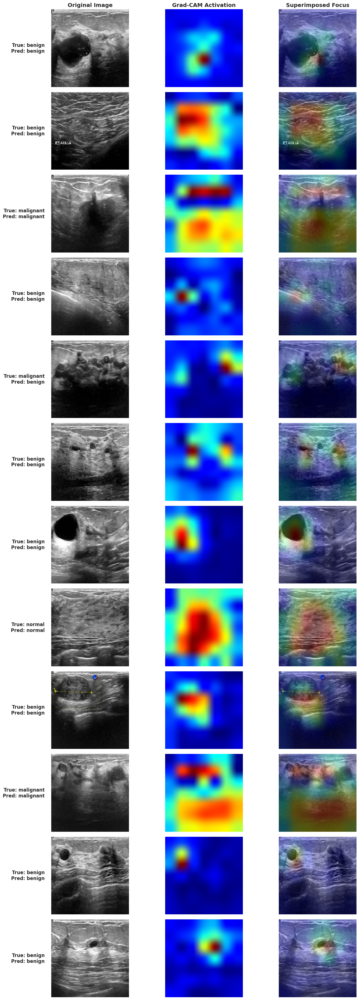

In [22]:

# 1. Dynamically find the last convolutional layer in your custom model
last_conv_layer_name = None
for layer in reversed(model.layers):
    try:
        shape = layer.output.shape
    except AttributeError:
        continue
    if shape is not None and len(shape) == 4:
        last_conv_layer_name = layer.name
        break

if last_conv_layer_name is None:
    raise ValueError("Could not find a 4D (conv-like) layer in the model.")

print(f"Found target spatial layer for Grad-CAM: '{last_conv_layer_name}'")

# 1b. Build a version of the model that outputs PRE-SOFTMAX LOGITS.
from tensorflow.keras import layers

final_dense_layer_name = model.layers[-1].name
final_dense = model.get_layer(final_dense_layer_name)
pre_final_layer_output = model.layers[-2].output

logits_layer = layers.Dense(final_dense.units, activation=None, name='logits_layer')
logits = logits_layer(pre_final_layer_output)
logits_layer.set_weights(final_dense.get_weights())

grad_model = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=[model.get_layer(last_conv_layer_name).output, logits]
)

# 2. Define the Grad-CAM algorithm for Functional API models (logits-based)
def make_gradcam_heatmap(img_array, grad_model, class_index=None):
    with tf.GradientTape() as tape:
        conv_outputs, logits_out = grad_model(img_array)
        if class_index is None:
            class_index = tf.argmax(logits_out[0])
        loss = logits_out[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Use absolute value instead of ReLU-only clipping.
    # Your architecture's SE-block gating (Multiply layers) can push
    # channel-importance gradients consistently negative, so tf.maximum(heatmap, 0)
    # was wiping out the entire map. tf.abs() keeps both positive and
    # negative contributions visible as intensity.
    heatmap = tf.abs(heatmap)
    max_val = tf.math.reduce_max(heatmap)
    heatmap = heatmap / (max_val + 1e-10)
    return heatmap.numpy(), class_index.numpy()

# 3. Superimpose Heatmap Function
def display_gradcam(img_path, heatmap, alpha=0.4):
    img = load_img(img_path, target_size=(224, 224))
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)
    jet = plt.colormaps["jet"]
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    return img / 255.0, jet_heatmap / 255.0, superimposed_img

# 4. Generate Visualizations for Sample Test Images
num_samples = 12
sample_df = test_df.sample(num_samples, random_state=seed_value)

fig, axes = plt.subplots(num_samples, 3, figsize=(15, 3 * num_samples))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

axes[0, 0].set_title("Original Image", fontsize=14, fontweight='bold')
axes[0, 1].set_title("Grad-CAM Activation", fontsize=14, fontweight='bold')
axes[0, 2].set_title("Superimposed Focus", fontsize=14, fontweight='bold')

for i, (index, row) in enumerate(sample_df.iterrows()):
    img_path = row['filepath']
    true_label = row['label']
    img_array = img_to_array(load_img(img_path, target_size=(224, 224)))
    img_array_scaled = np.expand_dims(img_array, axis=0) / 255.0

    heatmap, pred_idx = make_gradcam_heatmap(img_array_scaled, grad_model)
    pred_label = class_labels[pred_idx]

    print(f"Image {i}: heatmap min={heatmap.min():.6f}, max={heatmap.max():.6f}, mean={heatmap.mean():.6f}")

    orig_img, raw_heatmap, superimposed = display_gradcam(img_path, heatmap)

    axes[i, 0].imshow(orig_img)
    axes[i, 0].axis('off')
    axes[i, 0].text(-20, 112, f"True: {true_label}\nPred: {pred_label}",
                    fontsize=12, fontweight='bold', ha='right', va='center')

    axes[i, 1].imshow(raw_heatmap)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(superimposed)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

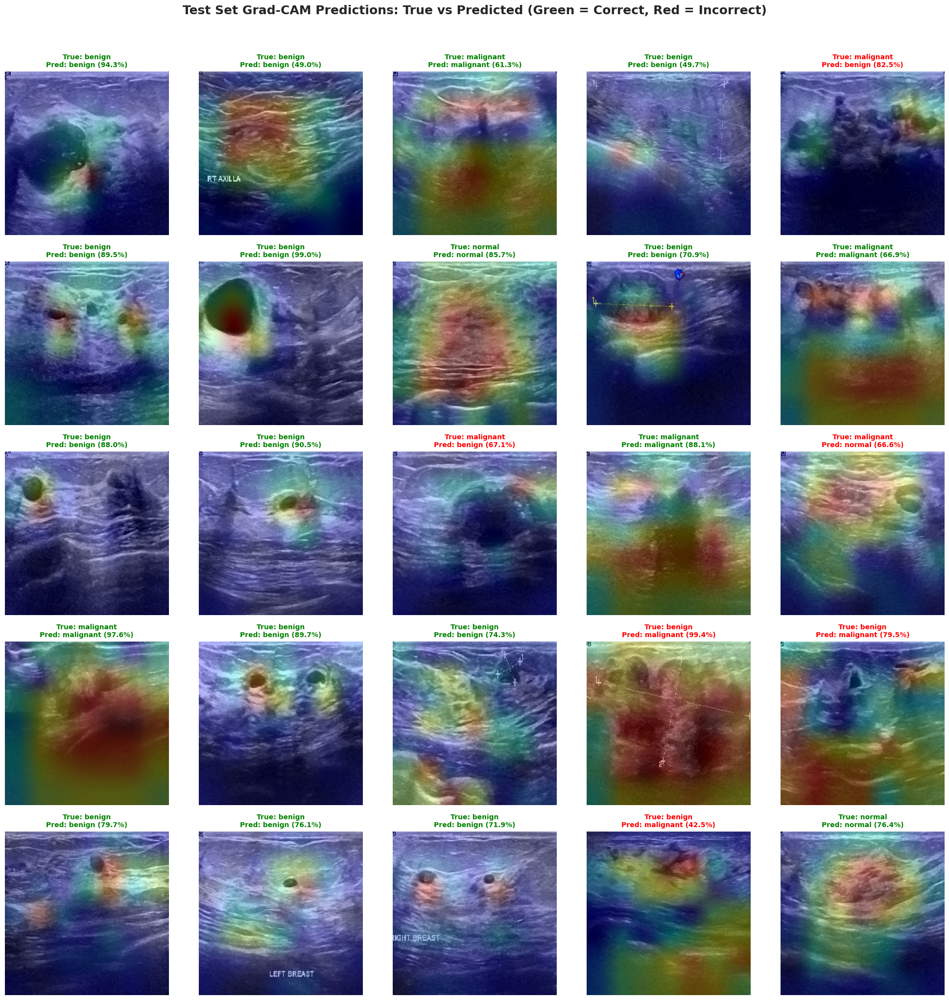

In [23]:

# 1. Sample 25 random images from the test set
num_grid = 25
grid_rows, grid_cols = 5, 5
sample_df = test_df.sample(num_grid, random_state=seed_value).reset_index(drop=True)

# 2. Plot the grid with Grad-CAM overlays
fig, axes = plt.subplots(grid_rows, grid_cols, figsize=(20, 20))
fig.suptitle("Test Set Grad-CAM Predictions: True vs Predicted (Green = Correct, Red = Incorrect)",
             fontsize=18, fontweight='bold', y=1.02)

for idx, row in sample_df.iterrows():
    img_path = row['filepath']
    true_label = row['label']

    # Preprocess image
    img_array = img_to_array(load_img(img_path, target_size=(224, 224)))
    img_array_scaled = np.expand_dims(img_array, axis=0) / 255.0

    # Generate Grad-CAM heatmap + prediction (uses grad_model defined earlier)
    heatmap, pred_idx = make_gradcam_heatmap(img_array_scaled, grad_model)
    pred_label = class_labels[pred_idx]

    # Get confidence from the actual softmax model (not the logits grad_model)
    pred_probs = model.predict(img_array_scaled, verbose=0)[0]
    confidence = pred_probs[pred_idx] * 100

    # Generate superimposed Grad-CAM visual (uses display_gradcam defined earlier)
    _, _, superimposed = display_gradcam(img_path, heatmap)

    # Determine correctness and title color
    is_correct = (pred_label == true_label)
    title_color = 'green' if is_correct else 'red'

    # Plot
    r, c = divmod(idx, grid_cols)
    ax = axes[r, c]
    ax.imshow(superimposed)
    ax.axis('off')
    ax.set_title(
        f"True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)",
        fontsize=10, fontweight='bold', color=title_color
    )

plt.tight_layout()
plt.show()

Extracting features from layer: 'dropout_1'
Extracting features from test images...
Extracted feature matrix shape: (78, 256)
Running t-SNE (this can take a minute)...


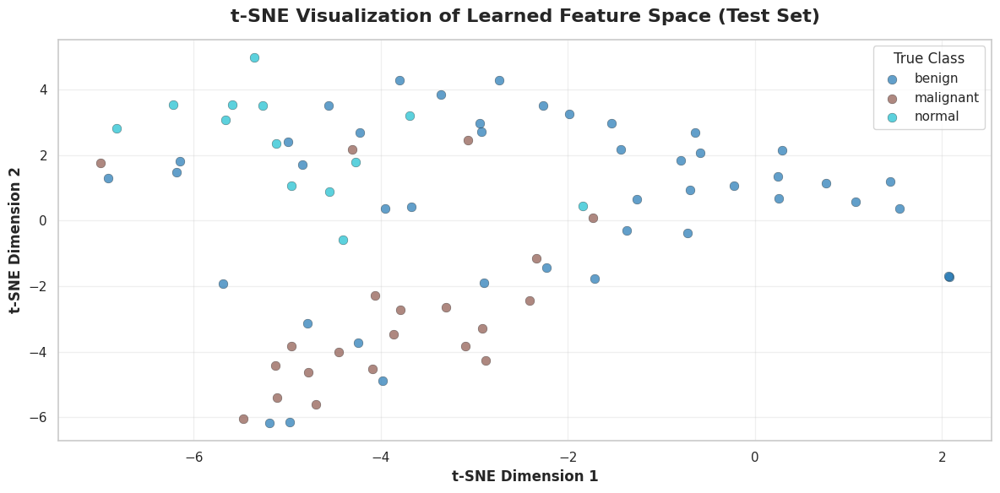

In [24]:
# 1. Build a feature-extraction model
# We tap the output right before the final classification Dense layer —
# this is the model's learned high-dimensional representation (its "embedding")
# just before it gets collapsed into class probabilities.
feature_layer_name = model.layers[-2].name  # e.g. 'dropout_1', the layer feeding into dense_17
print(f"Extracting features from layer: '{feature_layer_name}'")

feature_extractor = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=model.get_layer(feature_layer_name).output
)

# 2. Run feature extraction over the test set
print("Extracting features from test images...")
features_list = []
true_labels_list = []

for idx, row in test_df.iterrows():
    img_path = row['filepath']
    true_label = row['label']

    img_array = img_to_array(load_img(img_path, target_size=(224, 224)))
    img_array_scaled = np.expand_dims(img_array, axis=0) / 255.0

    feat = feature_extractor.predict(img_array_scaled, verbose=0)
    features_list.append(feat.flatten())
    true_labels_list.append(true_label)

features_array = np.array(features_list)
true_labels_array = np.array(true_labels_list)

print(f"Extracted feature matrix shape: {features_array.shape}")

# 3. Run t-SNE to reduce to 2D
print("Running t-SNE (this can take a minute)...")
tsne = TSNE(
    n_components=2,
    perplexity=min(30, len(features_array) - 1),  # perplexity must be < n_samples
    random_state=seed_value,
    init='pca',
    learning_rate='auto'
)
tsne_results = tsne.fit_transform(features_array)

# 4. Plot the 2D scatter, colored by true class label
plt.figure(figsize=(12, 6))

colors = plt.cm.get_cmap('tab10', len(class_labels))
for i, label in enumerate(class_labels):
    mask = true_labels_array == label
    plt.scatter(
        tsne_results[mask, 0],
        tsne_results[mask, 1],
        label=label,
        alpha=0.7,
        s=60,
        color=colors(i),
        edgecolors='k',
        linewidths=0.3
    )

plt.title('t-SNE Visualization of Learned Feature Space (Test Set)',
          fontsize=16, fontweight='bold', pad=15)
plt.xlabel('t-SNE Dimension 1', fontsize=12, fontweight='bold')
plt.ylabel('t-SNE Dimension 2', fontsize=12, fontweight='bold')
plt.legend(title='True Class', fontsize=11, title_fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

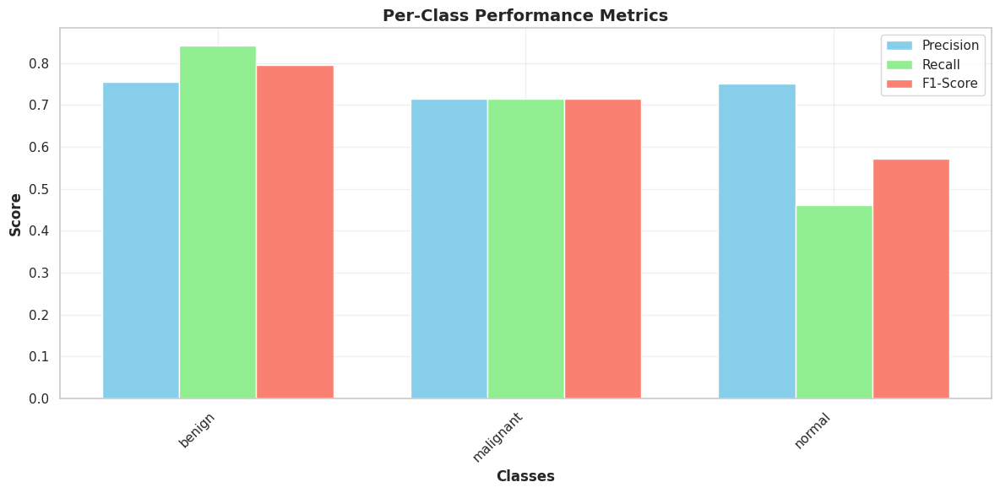

In [25]:
# Shows accuracy, precision, recall, F1 per class


classes = class_labels
precision = precision_score(true_classes, predicted_classes, average=None)
recall = recall_score(true_classes, predicted_classes, average=None)
f1 = f1_score(true_classes, predicted_classes, average=None)

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - width, precision, width, label='Precision', color='skyblue')
ax.bar(x, recall, width, label='Recall', color='lightgreen')
ax.bar(x + width, f1, width, label='F1-Score', color='salmon')

ax.set_xlabel('Classes', fontweight='bold')
ax.set_ylabel('Score', fontweight='bold')
ax.set_title('Per-Class Performance Metrics', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45, ha='right')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

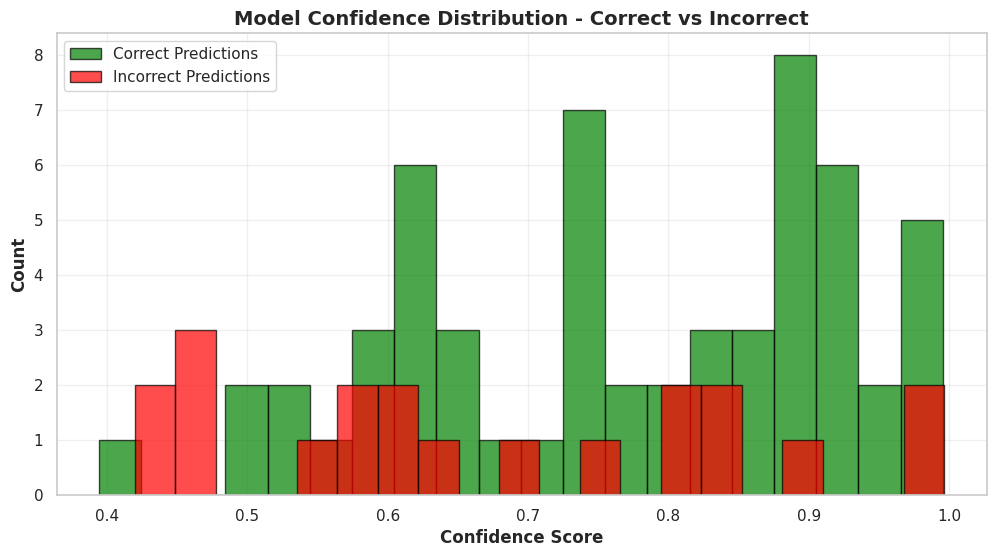

In [26]:
# Shows model confidence for correct vs incorrect predictions
max_confidences = np.max(predictions, axis=1)
correct_mask = (predicted_classes == true_classes)

plt.figure(figsize=(12, 6))
plt.hist(max_confidences[correct_mask], bins=20, alpha=0.7, 
         label='Correct Predictions', color='green', edgecolor='black')
plt.hist(max_confidences[~correct_mask], bins=20, alpha=0.7, 
         label='Incorrect Predictions', color='red', edgecolor='black')
plt.xlabel('Confidence Score', fontweight='bold')
plt.ylabel('Count', fontweight='bold')
plt.title('Model Confidence Distribution - Correct vs Incorrect', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

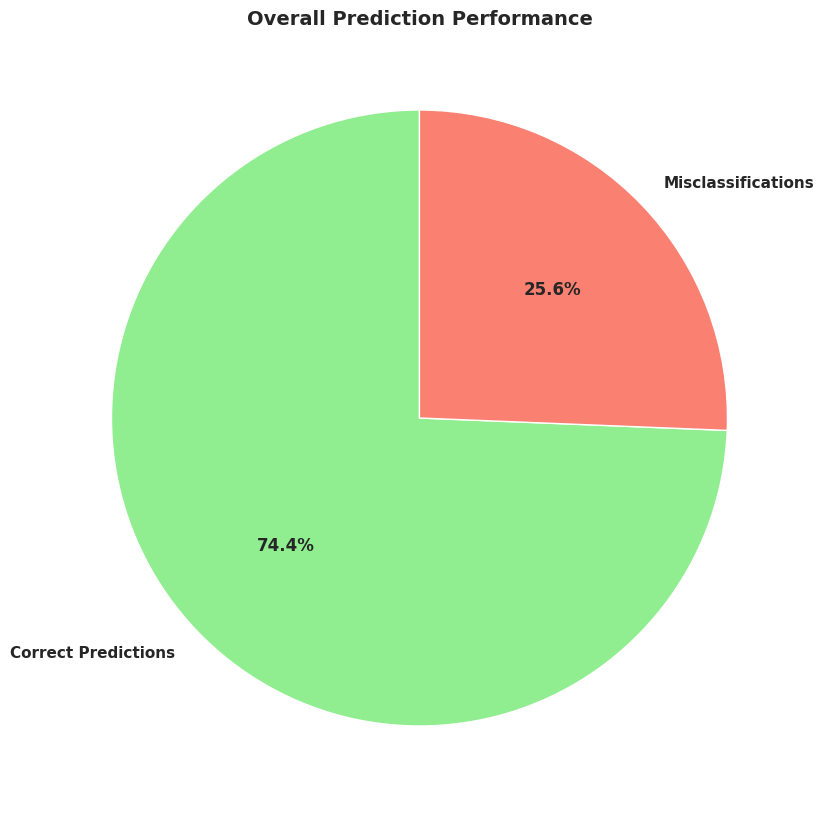

In [27]:
# Shows types of errors made
error_types = {
    'Correct Predictions': np.sum(correct_mask),
    'Misclassifications': np.sum(~correct_mask)
}

plt.figure(figsize=(12, 10))
plt.pie(error_types.values(), labels=error_types.keys(), 
        autopct='%1.1f%%', startangle=90,
        colors=['lightgreen', 'salmon'],
        textprops={'fontweight': 'bold'})
plt.title('Overall Prediction Performance', fontsize=14, fontweight='bold')
plt.show()

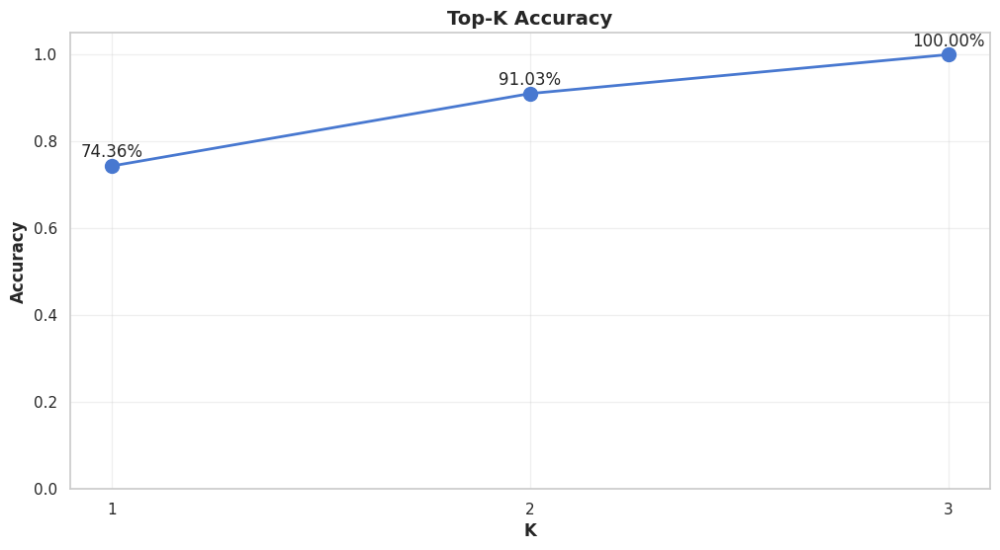

In [28]:
# Shows if correct class is in top-K predictions
def top_k_accuracy(predictions, true_labels, k):
    top_k_preds = np.argsort(predictions, axis=1)[:, -k:]
    correct_top_k = [true_labels[i] in top_k_preds[i] for i in range(len(true_labels))]
    return np.mean(correct_top_k)

k_values = range(1, min(6, predictions.shape[1]+1))
top_k_scores = [top_k_accuracy(predictions, true_classes, k) for k in k_values]

plt.figure(figsize=(12, 6))
plt.plot(k_values, top_k_scores, 'bo-', linewidth=2, markersize=10)
plt.xlabel('K', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.title('Top-K Accuracy', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.xticks(k_values)
plt.ylim([0, 1.05])
for k, score in zip(k_values, top_k_scores):
    plt.text(k, score + 0.02, f'{score:.2%}', ha='center')
plt.show()

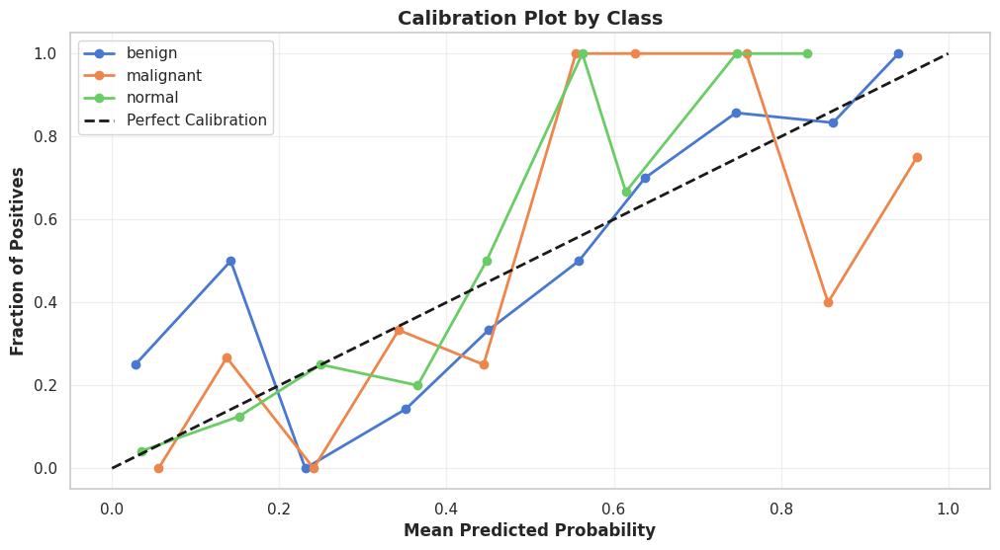

In [29]:
plt.figure(figsize=(12, 6))
for class_idx in range(predictions.shape[1]):
    prob_true, prob_pred = calibration_curve(
        (np.array(true_classes) == class_idx).astype(int), 
        predictions[:, class_idx], 
        n_bins=10
    )
    plt.plot(prob_pred, prob_true, 'o-', 
             label=class_labels[class_idx], linewidth=2)

plt.plot([0, 1], [0, 1], 'k--', label='Perfect Calibration', linewidth=2)
plt.xlabel('Mean Predicted Probability', fontweight='bold')
plt.ylabel('Fraction of Positives', fontweight='bold')
plt.title('Calibration Plot by Class', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
import gradio as gr

# Define clinical colors
CLASS_COLORS = {"benign": "#eab308", "malignant": "#ef4444", "normal": "#22c55e"}

# Safely dynamically find the last conv layer for Grad-CAM
last_conv_layer_name = None
for layer in reversed(model.layers):
    try:
        if len(layer.output.shape) == 4:
            last_conv_layer_name = layer.name
            break
    except AttributeError:
        pass

def make_gradcam_heatmap_gradio(img_array, target_model, layer_name, class_index):
    grad_model = tf.keras.models.Model(
        inputs=[target_model.inputs],
        outputs=[target_model.get_layer(layer_name).output, target_model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def predict_and_explain(input_image):
    if input_image is None:
        return None, None, "<div style='text-align:center;color:#64748b;padding:20px;'>Please upload an ultrasound image.</div>"

    try:
        # Preprocess
        img_resized = input_image.resize((224, 224))
        img_array = img_to_array(img_resized)
        img_array_scaled = np.expand_dims(img_array, axis=0) / 255.0

        # Predict
        pred_probs = model.predict(img_array_scaled, verbose=0)[0]
        pred_idx = int(np.argmax(pred_probs))
        pred_label = class_labels[pred_idx]
        confidence = float(pred_probs[pred_idx]) * 100

        # Generate Grad-CAM
        heatmap = make_gradcam_heatmap_gradio(img_array_scaled, model, last_conv_layer_name, pred_idx)
        heatmap_uint8 = np.uint8(255 * heatmap)
        jet = plt.colormaps["jet"]
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap_uint8]
        jet_heatmap_img = Image.fromarray(np.uint8(jet_heatmap * 255)).resize((224, 224))
        superimposed = Image.blend(img_resized.convert("RGB"), jet_heatmap_img, alpha=0.5)

        # Plot Data
        conf_df = pd.DataFrame({
            "Class": [c.capitalize() for c in class_labels],
            "Confidence": [float(p) * 100 for p in pred_probs]
        })

        # HTML Diagnosis Card
        color = CLASS_COLORS.get(pred_label.lower(), "#6b7280")
        result_html = f"""
        <div style="background-color: {color}15; border-left: 6px solid {color}; padding: 20px; border-radius: 8px; margin-bottom: 20px;">
            <h3 style="margin: 0; color: #374151; font-size: 14px; text-transform: uppercase; letter-spacing: 1px;">AI Diagnosis</h3>
            <h1 style="margin: 10px 0 0 0; color: {color}; font-size: 36px; font-weight: 800;">{pred_label.upper()}</h1>
            <p style="margin: 5px 0 0 0; font-size: 18px; color: #4b5563; font-weight: 600;">Confidence: {confidence:.2f}%</p>
        </div>
        """
        return superimposed, conf_df, result_html

    except Exception as e:
        err_trace = traceback.format_exc()
        print(err_trace) 
        error_html = f"<div style='color:#ef4444; padding:10px; border:1px solid #ef4444; border-radius:5px;'><b>Error:</b> {str(e)}</div>"
        return None, None, error_html

def clear_all():
    """Function to completely reset the UI inputs and outputs"""
    return None, None, None, ""

# --- UI Design ---
custom_theme = gr.themes.Soft(
    primary_hue="blue", 
    secondary_hue="slate",
    font=[gr.themes.GoogleFont("Inter"), "system-ui", "sans-serif"]
).set(
    block_title_text_weight="600",
    block_border_width="1px",
    block_shadow="*shadow_sm",
    button_primary_background_fill="*primary_600",
    button_primary_background_fill_hover="*primary_700",
)

with gr.Blocks(theme=custom_theme, title="BUSI Ultrasound Classifier") as demo:
    
    # Premium Header
    gr.HTML("""
    <div style="text-align: center; max-width: 800px; margin: 0 auto; padding: 20px 0;">
        <h1 style="color: #0f172a; font-weight: 800; font-size: 2.2rem; margin-bottom: 8px;">
            🩺 Breast Ultrasound AI Diagnostic Assistant
        </h1>
        <p style="color: #64748b; font-size: 1.1rem;">
            ResSE-CNN powered by Grad-CAM Explainability. Upload a scan to receive an automated classification and attention heatmap.
        </p>
    </div>
    """)
    
    with gr.Row():
        
        # Left Panel (Inputs)
        with gr.Column(scale=1, variant="panel"):
            gr.Markdown("### 📂 1. Upload Patient Scan")
            input_image = gr.Image(type="pil", label="Ultrasound Image", height=320)
            
            with gr.Row():
                clear_btn = gr.Button("🗑️ Clear", variant="secondary", size="lg")
                submit_btn = gr.Button("🔍 Analyze Scan", variant="primary", size="lg")
                
            gr.Markdown("<p style='font-size:12px; color:#94a3b8; text-align:center; margin-top: 10px;'><i>Research/educational use only — not a substitute for clinical diagnosis.</i></p>")

        # Right Panel (Outputs)
        with gr.Column(scale=1, variant="panel"):
            gr.Markdown("### 📋 2. AI Diagnosis & Analysis")
            result_html = gr.HTML()
            
            with gr.Tabs():
                with gr.TabItem("🧠 Explainability (Grad-CAM)"):
                    output_image = gr.Image(type="pil", label="Attention Heatmap", height=320, interactive=False)
                with gr.TabItem("📊 Confidence Distribution"):
                    confidence_plot = gr.BarPlot(
                        x="Confidence", y="Class", orientation="h",
                        title="Model Confidence per Class (%)", 
                        x_lim=[0, 100], height=320, color="Class"
                    )

    # Button Triggers
    submit_btn.click(
        fn=predict_and_explain,
        inputs=input_image,
        outputs=[output_image, confidence_plot, result_html]
    )
    
    clear_btn.click(
        fn=clear_all,
        inputs=[],
        outputs=[input_image, output_image, confidence_plot, result_html]
    )

try:
    demo.close()
except Exception:
    pass

# Launch settings updated to restore Kaggle inline display
demo.launch(share=True, inline=True, debug=True)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://186d1d208348f4a0ab.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
